In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI2 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI2")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI2.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI2 (Kelapa Gading),0.458824,0.196078,0.142857,0.244541,0.061644,0.260684,O3,Sedang
1,2017-01-02,DKI2 (Kelapa Gading),0.164706,0.166667,0.057143,0.152838,0.089041,0.170940,O3,Baik
2,2017-01-03,DKI2 (Kelapa Gading),0.223529,0.166667,0.085714,0.218341,0.054795,0.235043,O3,Sedang
3,2017-01-04,DKI2 (Kelapa Gading),0.117647,0.176471,0.108571,0.244541,0.089041,0.260684,O3,Sedang
4,2017-01-05,DKI2 (Kelapa Gading),0.176471,0.147059,0.071429,0.227074,0.068493,0.243590,O3,Sedang


Train Test Data

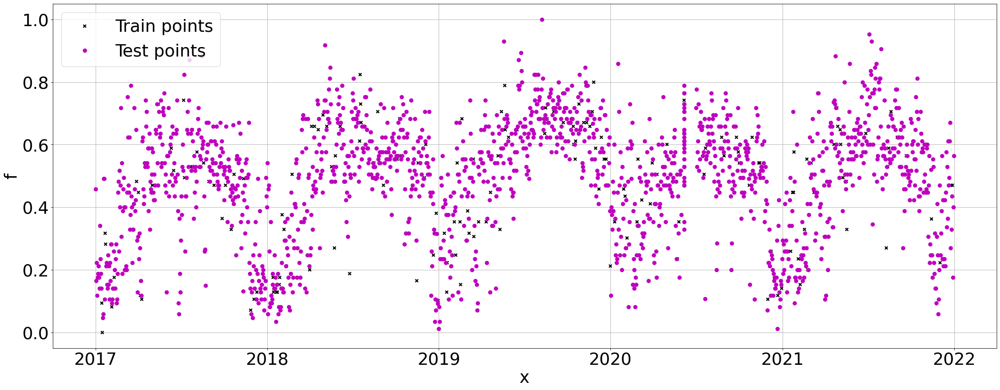

In [4]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI2.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI2['PM10']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.9, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI2['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI2['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [5]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [351]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [6]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [353]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.11323043335217246
MSE: 0.020642584286599992
RMSE: 0.14367527374812963
MAPE: 0.39392237695173626
R2 Square 0.40966013446370375
__________________________________


In [354]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.5348020460426504

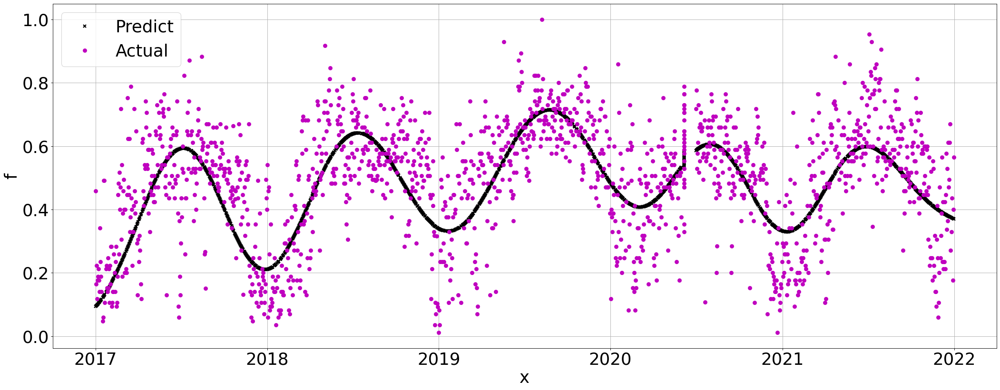

In [355]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI2['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI2['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

Periodic

In [7]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [357]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [358]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.15537100403808113
MSE: 0.03491469963938922
RMSE: 0.1868547554636735
MAPE: 0.5797421948966138
R2 Square 0.0015039394201694645
__________________________________


In [359]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.07335929571847466

White

In [360]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [361]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [362]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.4928890816427432
MSE: 0.2779069351253409
RMSE: 0.5271687918734766
MAPE: 1.0
R2 Square -6.947626151634329
__________________________________


In [363]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-5.71721209047037

Linear

In [364]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [365]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [366]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.23970573947705967
MSE: 0.0846268382536482
RMSE: 0.29090692369493065
MAPE: 0.6638832217239721
R2 Square -1.4201716036034737
__________________________________


In [367]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

-1.0300572515762147

Exponential

In [368]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [369]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [370]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.12190004869128636
MSE: 0.025298141022755214
RMSE: 0.1590538934536191
MAPE: 0.3544481707479531
R2 Square 0.2765197921761079
__________________________________


In [371]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.9999999999995965

Matern32

In [372]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [373]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [374]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.11136984992002331
MSE: 0.02031691009327628
RMSE: 0.14253739892840853
MAPE: 0.38174927329213365
R2 Square 0.41897381616295515
__________________________________


In [375]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.5861211351036646

Matern52

In [376]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [377]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [378]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.11191250500275181
MSE: 0.020426101335616936
RMSE: 0.14291991231321455
MAPE: 0.387053979871511
R2 Square 0.4158511478755854
__________________________________


In [379]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.5612119802708175

Brownian

In [380]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [381]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [382]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.11006548974422503
MSE: 0.02003674442033906
RMSE: 0.1415512077671507
MAPE: 0.36277486964592853
R2 Square 0.42698603805307034
__________________________________


In [383]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.7432934288883983

Bias

In [384]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [385]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [386]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.15658580128467395
MSE: 0.035892998899851064
RMSE: 0.18945447711746236
MAPE: 0.5951766827278555
R2 Square -0.026473616386649024
__________________________________


In [387]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-5.338982273173087e-06

Periodik Eksponensial

In [388]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [389]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [390]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.4928890817290689
MSE: 0.2779069352220749
RMSE: 0.5271687919652251
MAPE: 1.0000000001707572
R2 Square -6.947626154400742
__________________________________


In [391]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

-5.7172120689161146